# 解析 JSON 并导入 python-igraph

In [ ]:
"""
centrality_analysis.py
======================
在 python‑igraph 上批量计算四种中心度指标 + PageRank，并生成加权综合得分。

使用方法：
1. 先从 Neo4j 导出的边表存为 edges.csv，包含至少兩列：source,target
   (可选第三列 weight)。
2. 修改 EDGE_FILE 路径与 WEIGHTS 开关。
3. 运行：    python centrality_analysis.py
4. 输出：打印 Top‑20 节点并保存 centrality_top20.csv

依赖：
    pip install pandas igraph numpy

(无需 scikit‑learn，脚本自带归一化函数)
"""

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import igraph as ig
import json
import matplotlib.pyplot as plt

In [2]:
# ----------------- 参数 -----------------
EDGE_FILE = "neo4j_FullKG.csv"   # 边表 CSV 路径
DIRECTED  = True                # 是否有向
WEIGHTS   = False               # 第三列是否为权重

In [3]:
df = pd.read_csv(EDGE_FILE, sep=';')

In [4]:
df.head()

,source,target,type
0,Robert Ng,Ng Teng Fong,FAMILY
1,Robert Ng,Kim Choo TAN,FAMILY
2,Robert Ng,Nikki Ng Mien Hua,FAMILY
3,Robert Ng,"Daryl Ng Win Kong, JP",FAMILY
4,Robert Ng,Alexander Ng Win Yew,FAMILY


In [5]:
# ----------------- 工具函数 -------------
def normalize(arr):
    """Min‑max 归一化，数组元素都转到 0‑1 区间"""
    arr = np.asarray(arr, dtype=float)
    if arr.ptp() == 0:
        return np.zeros_like(arr)
    return (arr - arr.min()) / arr.ptp()

# ----------------- 1. 读取边表 ----------
# print(f"[INFO] Loading edge list from {EDGE_FILE.resolve()}")

In [7]:

if WEIGHTS and df.shape[1] >= 3:
    edges = list(df.itertuples(index=False, name=None))  # (src, tgt, w)
else:
    edges = list(df[['source', 'target']].itertuples(index=False, name=None))

# ----------------- 2. 构建图 -------------
print("[INFO] Building igraph Graph …")

g = ig.Graph.TupleList(edges, directed=DIRECTED, weights=WEIGHTS)
print(g.summary())


[INFO] Building igraph Graph …
IGRAPH DN-- 17342 24368 -- 
+ attr: name (v)


In [ ]:
print("[INFO] Computing weakly connected comps …")
comps = g.comps(mode="WEAK")  # List[List[int]]

records = [
    {
        "component_id": idx,
        "size"        : len(comp),
        "nodes"       : list(comp),   # 若有 name 属性，可改为 [g.vs[i]['name'] for i in comp]
    }
    for idx, comp in enumerate(comps)
]

[INFO] Computing weakly connected components …


In [8]:

# 按 size 降序打印前 100 个组件
records_sorted = sorted(records, key=lambda x: x["size"], reverse=True)
print("\nTop 100 components by size:")
for rec in records_sorted[:100]:
    print(f"  comp #{rec['component_id']}: {rec['size']} nodes")

# 保存 JSON
out_path = Path("components.json")
with open(out_path, "w", encoding="utf-8") as f:
    json.dump(records_sorted, f, ensure_ascii=False, indent=2)
print(f"[INFO] All components written to {out_path.resolve()}")


Top 100 components by size:
  comp #0: 11082 nodes
  comp #1487: 123 nodes
  comp #1970: 54 nodes
  comp #1853: 49 nodes
  comp #1801: 46 nodes
  comp #1912: 43 nodes
  comp #1848: 40 nodes
  comp #1682: 37 nodes
  comp #7: 34 nodes
  comp #2078: 31 nodes
  comp #1807: 30 nodes
  comp #2054: 30 nodes
  comp #1819: 25 nodes
  comp #2124: 25 nodes
  comp #2156: 24 nodes
  comp #2161: 23 nodes
  comp #1961: 21 nodes
  comp #1968: 21 nodes
  comp #1828: 20 nodes
  comp #2007: 20 nodes
  comp #1855: 19 nodes
  comp #1918: 18 nodes
  comp #1990: 17 nodes
  comp #1998: 17 nodes
  comp #2083: 17 nodes
  comp #2: 16 nodes
  comp #1880: 16 nodes
  comp #1883: 16 nodes
  comp #1978: 16 nodes
  comp #1774: 15 nodes
  comp #1812: 15 nodes
  comp #1837: 15 nodes
  comp #1827: 14 nodes
  comp #2030: 13 nodes
  comp #2053: 13 nodes
  comp #2136: 13 nodes
  comp #667: 12 nodes
  comp #1782: 12 nodes
  comp #1836: 12 nodes
  comp #1865: 12 nodes
  comp #18: 11 nodes
  comp #1771: 11 nodes
  comp #1785:

In [9]:
# # ---- 保存 JSON 全量 ----
# Path("outputs").mkdir(exist_ok=True)
# json_path = Path("outputs/components.json")
# with open(json_path, "w", encoding="utf-8") as f:
#     json.dump(records, f, ensure_ascii=False, indent=2)
# print(f"[INFO] Full component list written to {json_path.resolve()}")

# ---- DataFrame + CSV ----
df_sizes = pd.DataFrame([{"component_id": r["component_id"], "size": r["size"]} for r in records])
csv_path = Path("outputs/components_sizes.csv")
df_sizes.to_csv(csv_path, index=False)
print(f"[INFO] Component sizes CSV written to {csv_path.resolve()}")

[INFO] Component sizes CSV written to G:\My Drive\NUS MSBA SEM2\<Base Folder>\Neo4j\outputs\components_sizes.csv


In [10]:
df_sizes.sort_values("size", ascending=False).head(10)

,component_id,size
0,0,11082
1487,1487,123
1970,1970,54
1853,1853,49
1801,1801,46
1912,1912,43
1848,1848,40
1682,1682,37
7,7,34
2078,2078,31


[INFO] Histogram saved to G:\My Drive\NUS MSBA SEM2\<Base Folder>\Neo4j\outputs\components_hist.png
[DONE] components_listing complete.


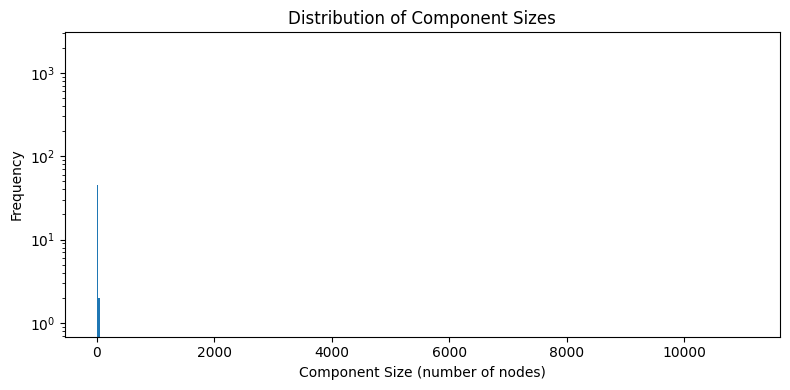

In [19]:

# ---- 绘制直方图 ----
plt.figure(figsize=(8,4))
plt.hist(df_sizes["size"], bins=2000, log=True)  # 让 matplotlib 自动选 bin
plt.title("Distribution of Component Sizes")
plt.xlabel("Component Size (number of nodes)")
plt.ylabel("Frequency")
plt.tight_layout()
hist_path = Path("outputs/components_hist.png")
plt.savefig(hist_path, dpi=150)
print(f"[INFO] Histogram saved to {hist_path.resolve()}")

print("[DONE] components_listing complete.")

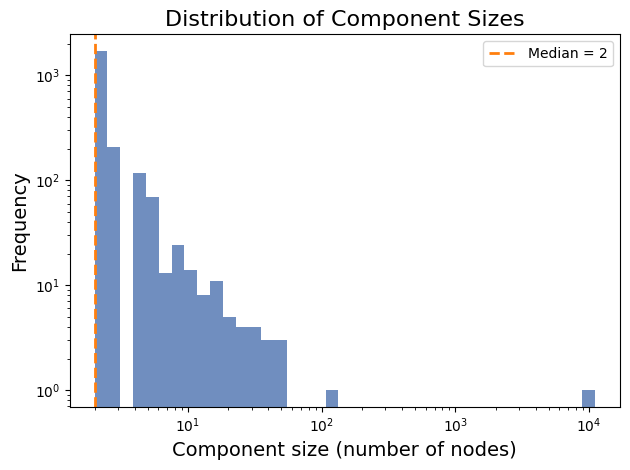

In [21]:
sizes = df_sizes["size"]

# Log‐spaced bins + log x‐axis
bins = np.logspace(np.log10(sizes.min()), np.log10(sizes.max()), 40)
plt.hist(sizes, bins=bins, color='#4C72B0', alpha=0.8)

plt.xscale('log')
plt.yscale('log')  # 如果想保留 y 轴的 log 刻度
plt.xlabel('Component size (number of nodes)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Component Sizes', fontsize=16)

# 标记中位数
med = np.median(sizes)
plt.axvline(med, color='C1', linestyle='--', linewidth=2,
            label=f'Median = {int(med)}')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:

# ----------------- 3. 计算中心度 ---------
print("[INFO] Computing centrality metrics …")

deg_total  = g.degree(mode="all")
closeness  = g.closeness(mode="OUT" if DIRECTED else "ALL")
between    = g.betweenness(directed=DIRECTED)
# Eigenvector centrality 会在有向图上默认使用 Arnodi 方法
# 若图较大，可调 maxiter 或 tol
try:
    eigenvec = g.eigenvector_centrality(directed=DIRECTED, weights="weight" if WEIGHTS else None)
except ig.InternalError:
    eigenvec = [0]*g.vcount()
    print("[WARN] Eigenvector centrality failed to converge — returning zeros.")

pagerank   = g.pagerank(directed=DIRECTED, damping=0.85, weights="weight" if WEIGHTS else None)

# ----------------- 4. 归一化 & 综合得分 -
metric_norm = {
    'degree'    : normalize(deg_total),
    'closeness' : normalize(closeness),
    'betweenness': normalize(between),
    'eigenvector': normalize(eigenvec),
    'pagerank'  : normalize(pagerank),
}
print(metric_norm)


[INFO] Computing centrality metrics …
{'degree': array([0.08333333, 0.03030303, 0.02272727, ..., 0.        , 0.        ,
       0.        ]), 'closeness': array([nan, nan, nan, ..., nan, nan, nan]), 'betweenness': array([0.06194432, 0.02040519, 0.00874508, ..., 0.        , 0.        ,
       0.        ]), 'eigenvector': array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 2.1510739e-19,
       2.1510739e-19, 2.1510739e-19]), 'pagerank': array([0.19159221, 0.06079491, 0.06079491, ..., 0.00501253, 0.00501253,
       0.00501253])}
{'degree': 0.3, 'closeness': 0.2, 'betweenness': 0.2, 'eigenvector': 0.1, 'pagerank': 0.2}


In [ ]:

WEIGHT_MAP = dict(
    degree=0.3,
    closeness=0.2,
    betweenness=0.2,
    eigenvector=0.1,
    pagerank=0.2,
)

influence = [
    sum(metric_norm[m][i] * w for m, w in WEIGHT_MAP.items())
    for i in range(g.vcount())
]

In [16]:

# ----------------- 5. 结果输出 ----------
print("[INFO] Assembling DataFrame …")

df_out = pd.DataFrame({
    'vertex_id'      : range(g.vcount()),
    'degree'         : deg_total,
    'closeness'      : closeness,
    'betweenness'    : between,
    'eigenvector'    : eigenvec,
    'pagerank'       : pagerank,
    'influence_score': influence,
})
print(df_out)

[INFO] Assembling DataFrame …
       vertex_id  degree  closeness  betweenness   eigenvector  pagerank  \
0              0      12     0.7500        42.50  0.000000e+00  0.000507   
1              1       5     0.5625        14.00  0.000000e+00  0.000190   
2              2       4     0.5000         6.00  0.000000e+00  0.000190   
3              3       4     0.5000         2.25  0.000000e+00  0.000194   
4              4       4     0.5000         2.25  0.000000e+00  0.000194   
...          ...     ...        ...          ...           ...       ...   
17337      17337       1        NaN         0.00  2.151074e-19  0.000049   
17338      17338       3     1.0000         0.00 -0.000000e+00  0.000043   
17339      17339       1        NaN         0.00  2.151074e-19  0.000055   
17340      17340       1        NaN         0.00  2.151074e-19  0.000055   
17341      17341       1        NaN         0.00  2.151074e-19  0.000055   

       influence_score  
0                  NaN  
1      

In [17]:
df_out.sort_values('influence_score', ascending=False, inplace=True)

top20 = df_out.head(20)
print("\nTop‑20 influential nodes:\n", top20[['vertex_id','influence_score']])

csv_path = Path("centrality_top20.csv")
top20.to_csv(csv_path, index=False)
print(f"[INFO] Saved top20 list to {csv_path.resolve()}")

print("[DONE] Centrality analysis complete.")



Top‑20 influential nodes:
     vertex_id  influence_score
0           0              NaN
1           1              NaN
2           2              NaN
3           3              NaN
4           4              NaN
5           5              NaN
6           6              NaN
7           7              NaN
8           8              NaN
9           9              NaN
10         10              NaN
11         11              NaN
12         12              NaN
13         13              NaN
14         14              NaN
15         15              NaN
16         16              NaN
17         17              NaN
18         18              NaN
19         19              NaN
[INFO] Saved top20 list to G:\My Drive\NUS MSBA SEM2\<Base Folder>\Neo4j\centrality_top20.csv
[DONE] Centrality analysis complete.


# 联通子图内部分级

In [1]:
"""
community_tiers.py  — 按度数分布自动分层（输出节点 *name* 而非索引）
=============================================================
在每个弱连通子图 (component) 中，根据度中心性的 **分位数** 自动划分三层：

| 层级 | 规则 (默认阈值，可修改) |
|------|-------------------------|
| **Tier‑1** | 度数 ≥ `Q_HIGH` (默认为 90‑分位) |
| **Tier‑2** | `Q_MID` ≤ 度数 < `Q_HIGH` (默认为 50‑分位) |
| **Tier‑3** | 度数 < `Q_MID` |

若节点带有 `name` 属性，则脚本会优先打印/导出 **节点名字**；若不存在 `name`，则回退使用全图索引。

参数一览
---------
```python
EDGE_FILE       = Path("edges.csv")   # 边表
DIRECTED        = True                 # 图是否有向
Q_HIGH          = 0.90                 # 高分位阈值 (0–1)
Q_MID           = 0.50                 # 中分位阈值 (0–1)
DEG_MODE        = "all"               # "all" | "in" | "out"
NAME_FIELD      = "name"              # 节点属性名，用作显示
```

运行
----
```bash
python community_tiers.py
```
输出
----
- **outputs/tiers.json**  : 每个 component 对应三层 **节点名字** 列表（若无名字则为索引）
- 终端打印前 5 个社区的分层结果

依赖
----
```bash
pip install pandas igraph numpy
```
"""

from pathlib import Path
import json
import pandas as pd
import igraph as ig

EDGE_FILE = "neo4j_FullKG.csv"
DIRECTED  = True


NAME_FIELD = "name"  # 节点属性名，若无该字段将回退索引
# ---------------------------------------------


df = pd.read_csv(EDGE_FILE, sep=';', header=0)

edges = list(df[['source', 'target']].itertuples(index=False, name=None))

g = ig.Graph.TupleList(edges, directed=DIRECTED)
print(g.summary())

print("[INFO] Detecting weakly connected components …")
comps = g.components(mode="WEAK")


IGRAPH DN-- 17342 24368 -- 
+ attr: name (v)
[INFO] Detecting weakly connected components …


In [2]:

# ---------------- 用户可调参数 ----------------
Q_HIGH    = 0.99   # 90‑分位及以上 → Tier1
Q_MID     = 0.80   # 50‑分位～90‑分位 → Tier2
DEG_MODE  = "all"  # in/out/all

In [5]:

from os import name
import numpy as np


results = []

for comp_id, comp in enumerate(comps):
    sub = g.subgraph(comp)
    deg = np.array(sub.degree(mode=DEG_MODE))
    if len(deg) == 0:
        continue

    q_high_val = np.quantile(deg, Q_HIGH)
    q_mid_val  = np.quantile(deg, Q_MID)

    # 获取 tier1 的节点索引并按度降序排序
    tier1_idx = np.where(deg >= q_high_val)[0]
    tier1_local = tier1_idx[np.argsort(deg[tier1_idx])[::-1]].tolist()

    # 获取 tier2 的节点索引并按度降序排序
    tier2_idx = np.where((deg >= q_mid_val) & (deg < q_high_val))[0]
    tier2_local = tier2_idx[np.argsort(deg[tier2_idx])[::-1]].tolist()

    # 获取 tier3 的节点索引并按度降序排序
    tier3_idx = np.where(deg < q_mid_val)[0]
    tier3_local = tier3_idx[np.argsort(deg[tier3_idx])[::-1]].tolist()

    # 若 tier1 为空，追加度数最高节点
    if not tier1_local:
        top_idx = int(np.argmax(deg))
        if top_idx in tier2_local:
            tier2_local.remove(top_idx)
        elif top_idx in tier3_local:
            tier3_local.remove(top_idx)
        tier1_local.append(top_idx)

    # 本地 idx → 名字或全图索引
    def to_name(loc_list):
        return [sub.vs[i][NAME_FIELD] if sub.vs[i][NAME_FIELD] is not None else str(sub.vs[i].index) for i in loc_list]

    # 映射到全图索引
    to_global = lambda loc_list: [sub.vs[i].index for i in loc_list]

    results.append({
        "component_id": comp_id,
        "size"       : len(comp),
        "tiers"      : {
            "tier1": to_name(tier1_local),
            "tier2": to_name(tier2_local),
            "tier3": to_name(tier3_local),
        }
    })

results.sort(key=lambda x: len(x['tiers']['tier2']) + len(x['tiers']['tier3']), reverse=True)

# 保存 JSON
out_dir = Path("outputs"); out_dir.mkdir(exist_ok=True)
json_path = out_dir / "tiers.json"
with open(json_path, "w", encoding="utf-8") as f:
    json.dump(results, f, ensure_ascii=False, indent=2)
print(f"[INFO] Saved tiers definition to {json_path.resolve()}")

# 打印示例
print("\nSample tiers (first 5 communities):")
for rec in results[:15]:
    print(
        f"Comp {rec['component_id']} → "
        f"tier1:{rec['tiers']['tier1']} "
        f"tier2:{len(rec['tiers']['tier2'])} nodes "
        f"tier3:{len(rec['tiers']['tier3'])} nodes"
    )

print("[DONE] community_tiers.py")


[INFO] Saved tiers definition to G:\My Drive\NUS MSBA SEM2\<Base Folder>\Neo4j\outputs\tiers.json

Sample tiers (first 5 communities):
Comp 0 → tier1:['PHILIPPINE NATIONAL BANK', 'MS Holdings Limited', 'DAIWA SECURITIES GROUP INC.', 'Country Garden Holdings Company Limited', 'PC PARTNER GROUP LIMITED', 'Chalermchai Mahagitsiri', 'PSC Corporation Limited', 'Ecowise Holdings Limited', 'ORIX Corporation', 'WILLAS-ARRAY ELECTRONICS (HOLDINGS) LIMITED', 'UPL LIMITED', 'Mitsubishi Corporation', 'WILMAR INTERNATIONAL LIMITED', 'SINGAPORE AIRLINES LIMITED', 'STARHUB LTD.', 'ABR Holdings Ltd', 'Lonza Group Ltd', 'SIA ENGINEERING COMPANY LIMITED', 'SILVERLAKE AXIS LTD.', 'MYP LTD.', 'BOC AVIATION LIMITED', 'CAPITALAND INVESTMENT LIMITED', 'TUNG LOK RESTAURANTS (2000) LTD', 'Powerlong Real Estate Holdings Limited', 'VICOM LTD', 'SINGAPORE TECHNOLOGIES ENGINEERING LTD', 'Landsea Green Management Limited', 'LHT HOLDINGS LIMITED', 'CHINA SOUTH CITY HOLDINGS LIMITED', 'Serge Pun', 'TIONG WOON CORPORA

In [13]:
import igraph as ig
from igraph import plot          # 可选：显式导入

# 新写法
# plot(g, target="graph.png", layout="circle", vertex_size=.1, vertex_color="lightblue", edge_color="gray")   # 保存为 PNG
plot(g, layout="kk", vertex_size=1, vertex_color="lightblue", edge_color="gray")# 直接在窗口显示（需要 Cairo）


In [ ]:
report = []

def triangle_count(graph: ig.Graph, directed=True):
    """Return triangle/triad count; robust to empty or large graphs."""
    if graph.vcount() < 3:
        return 0

    if directed:
        # triad_census returns 16-len vector; sum所有非空白模式
        triads = graph.triad_census()
        return sum(triads) - triads[-1]    # 去掉最后的 '003' 零边模式
    else:
        # motifs_randesu for undirected triangles
        tri = graph.motifs_randesu(size=3)
        return int(sum(tri)) if tri is not None else 0

for comp in comps:
    sub = g.subgraph(comp)
    size = len(comp)

    # 1. 基础度量
    deg  = sub.degree()
    btwn = sub.betweenness()

    # 2. 高层取关心指标
    top1 = sub.vs[np.argmax(deg)]["name"] if "name" in sub.vs.attributes() else np.argmax(deg)
    rich_core = np.max(sub.coreness())

    # 3. 风险—三角循环数
    # tri_cnt = sum(sub.motifs_randesu(size=3))
    tri_cnt = triangle_count(sub)
    report.append(dict(size=size, hub=top1, k_core=rich_core, triangles=tri_cnt))

df = pd.DataFrame(report)
df.to_csv("component_quickscan.csv", index=False)
print(df.head())

    size                       hub  k_core  triangles
0  11082  PHILIPPINE NATIONAL BANK      13        NaN
1      2           Goh Cheng Liang       2        NaN
2     16              Chua Lee Eng       4        NaN
3      2                Zhang Yong       1        NaN
4      3         Bobby Hiranandani       2        NaN
